In [ ]:
#Kindly change the path according to your local machine before running the notebook

In [1]:
import pandas as pd
from pathlib import Path
import random
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import tifffile as tiff
import cv2

data_path = Path('/Users/shambhavisingh/Desktop/dissertation/baseline/')
TRAIN_PATH= str(data_path) + "/train_images/"


### Configuration 

In [2]:
class CFG:
    ORGANS = ['kidney', 'largeintestine', 'lung', 'prostate', 'spleen']
    O2C_HEX_MAP = {'kidney': '#B6533D',
                   'largeintestine': '#8F54B7',
                   'lung': '#469C53',
                   'prostate': '#4671AC',
                   'spleen': '#E19C32'}
    O2C = {'Male' : '#547AB7',
          'Female' : '#E08B4C'}
    MAX_N_FTU = 50
    N_EX = 10

In [3]:
train_df = pd.read_csv(data_path / 'train.csv')
train_df.head()


,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,37.0,Male
1,10274,prostate,HPA,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,76.0,Male
2,10392,spleen,HPA,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,82.0,Male
3,10488,lung,HPA,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,78.0,Male
4,10610,spleen,HPA,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,21.0,Female


In [4]:
_data = train_df.drop_duplicates(subset=["img_width", "img_height"])
_data.shape

(20, 10)

### Image Size 

In [5]:
_size = train_df.groupby(["img_width", "img_height"]).id.transform("count").iloc[_data.index]


In [6]:
fig = px.scatter(data_frame=_data,
                 x="img_width",
                 y="img_height",
                 size=_size,
                 color="("+_data["img_width"].astype(str)+","+_data["img_height"].astype(str)+")",
                 title="<b>Bubble Chart Showing The Various Image Sizes</b>", 
                 labels={"color":"<b>Size Legend</b>", 
                         "size":"<b>Number Of Observations</b>",
                         "img_height":"<b>Image Height (pixels)</b>",
                         "img_width":"<b>Image Width (pixels)</b>"},
                 size_max=150 )
fig.show()

### Organ count 

In [7]:
fig = px.histogram(train_df, 
                   "organ", 
                   color_discrete_map = CFG.O2C_HEX_MAP, 
                   color="organ",
                   title="<b>Number of images per organ type</b>" )
fig.show()

In [8]:
fig= px.histogram(train_df,
                 "sex",
                 color_discrete_map= CFG.O2C,
                 title="<b>     Distribution according to the gender</b>",
                 color="sex")
fig.show()

### Ages

In [9]:
fig = px.histogram(train_df, 
                   train_df.age, 
                   color_discrete_map = CFG.O2C,
                   color="sex",
                   title="<b>      Number of images per gender grouped according to age</b>",
                   barmode='group')
fig.show()

### Gender 

In [10]:
fig = px.histogram(train_df, 
                   train_df.sex , 
                   color_discrete_map = CFG.O2C_HEX_MAP,
                   color="organ",
                   title="<b>      Number of images per organ grouped according to gender</b>",
                   barmode='group')
fig.show()

### Visualisation of the images 

In [17]:
# Reference : https://www.kaggle.com/code/ishandutta/hubmap-complete-understanding-and-eda-w-b
def sample_img(images_list,train_df,title):
    
        fig, ax = plt.subplots(2,3,figsize=(22,22))
        for i in enumerate(five_samples):
            
                colors = ["#570990","#e4b6fe",'#8b22ba', "#8a3cf6"]
                fig.suptitle(f'Plotting {title}', size = 25,y=1)
                ax[i[0],0].title.set_text(f'Sample id : {i[1]}')
                ax[i[0],1].title.set_text(f'Mask of id :{i[1]}')
                ax[i[0],2].title.set_text(f'(Mask + Image) id : {i[1]}')
                im = Image.open(images_list[i[0]])
                mask=rle2mask(train_df[train_df["id"]==i[1]]["rle"].iloc[-1], (im.size[1], im.size[0]))
                ax[i[0],0].imshow(im)
                ax[i[0],1].imshow(mask)
                ax[i[0],2].imshow( im)
                ax[i[0],2].imshow(mask, cmap='jet', alpha=0.5)
                ax[i[0],2].axis('off')
                ax[i[0],1].axis('off')
                ax[i[0],0].axis('off')
                
        fig.tight_layout() 
        plt.show()

### For prostate 

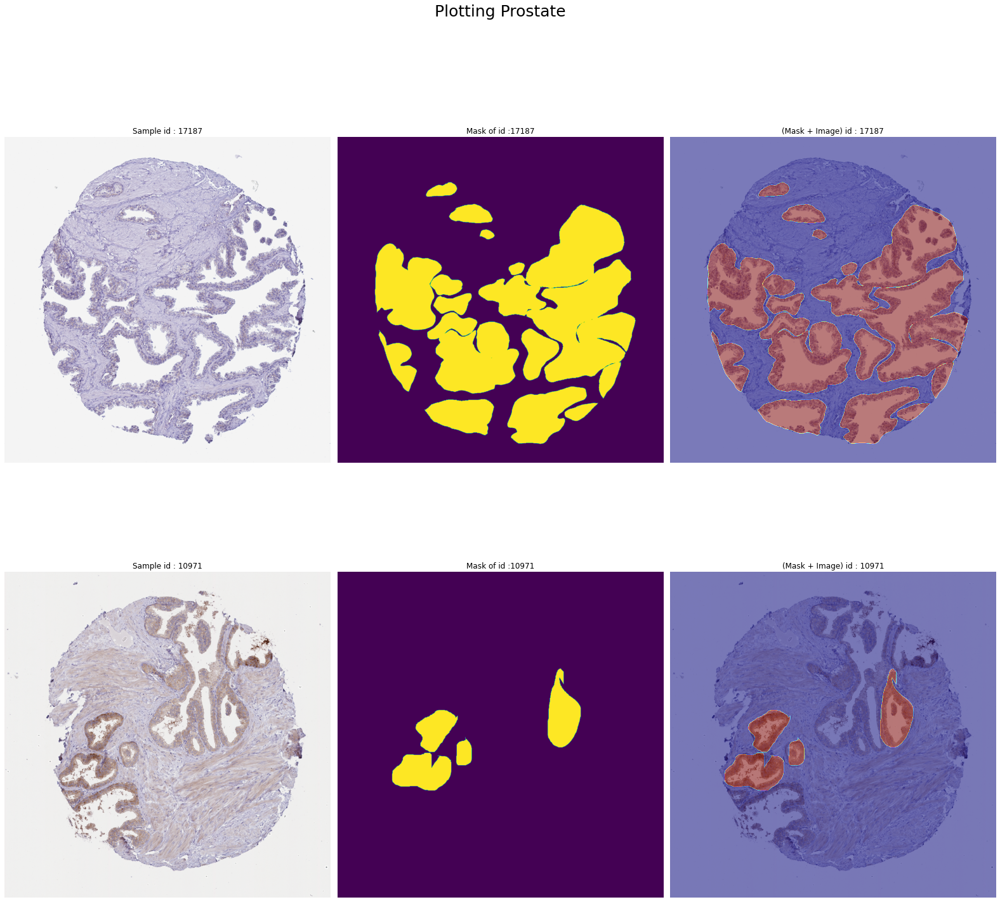

In [18]:
filtered_df = train_df.query('organ=="prostate"')
five_samples=random.sample(list(filtered_df ['id']),2)
images_list=[]
for sample in five_samples:
    images_list.append(f"/Users/shambhavisingh/Desktop/dissertation/baseline/train_images/{sample}.tiff")

sample_img(images_list,train_df,'Prostate')  

### For Spleen 

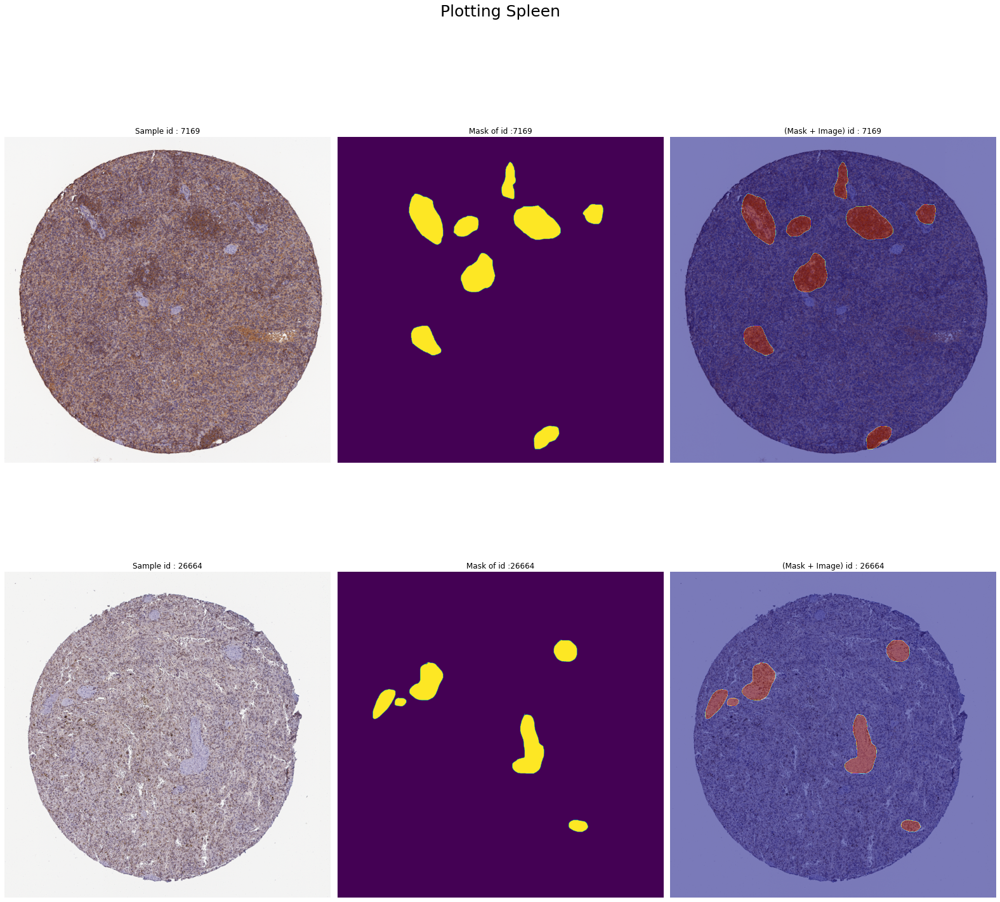

In [19]:
filtered_df = train_df.query('organ=="spleen"')
five_samples=random.sample(list(filtered_df ['id']),2)
images_list=[]
for sample in five_samples:
    images_list.append(f"/Users/shambhavisingh/Desktop/dissertation/baseline/train_images/{sample}.tiff")

sample_img(images_list,train_df,'Spleen')  

### For Lung 

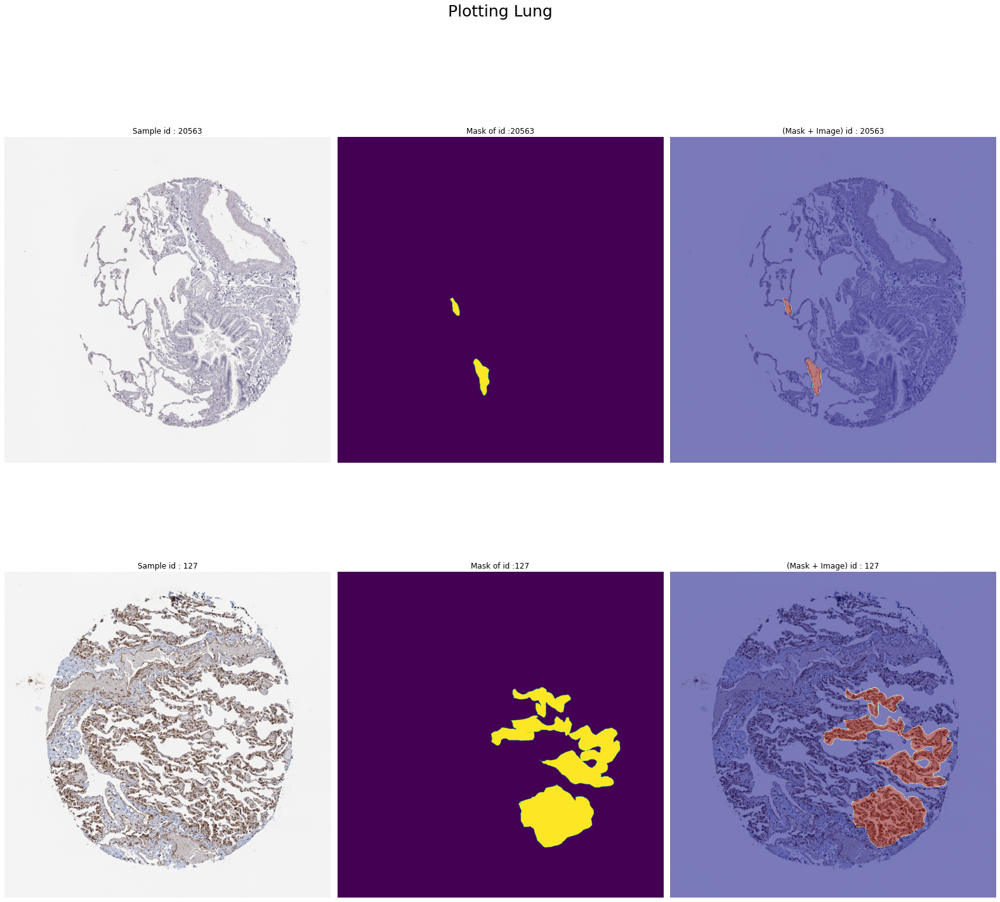

In [20]:
filtered_df = train_df.query('organ=="lung"')
five_samples=random.sample(list(filtered_df ['id']),2)
images_list=[]
for sample in five_samples:
    images_list.append(f"/Users/shambhavisingh/Desktop/dissertation/baseline/train_images/{sample}.tiff")

sample_img(images_list,train_df,'Lung')  

### For kidney 

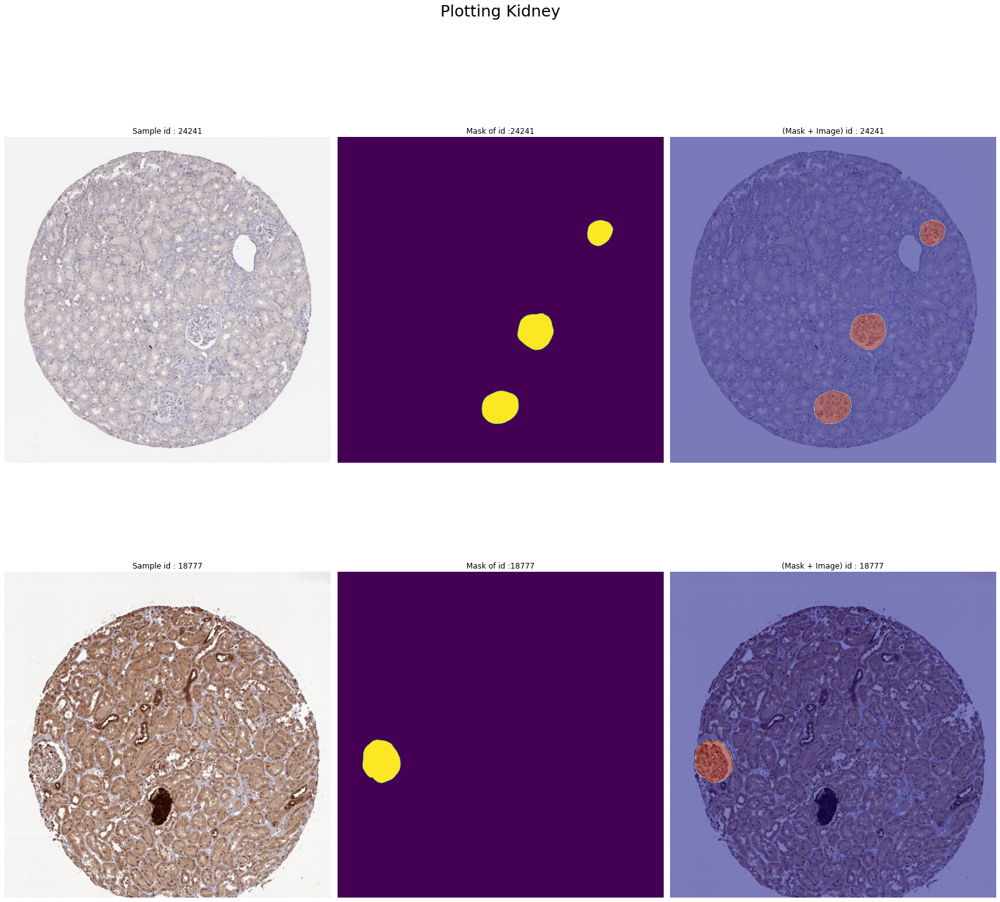

In [21]:
filtered_df = train_df.query('organ=="kidney"')
five_samples=random.sample(list(filtered_df ['id']),2)
images_list=[]
for sample in five_samples:
    images_list.append(f"/Users/shambhavisingh/Desktop/dissertation/baseline/train_images/{sample}.tiff")

sample_img(images_list,train_df,'Kidney')  

### Large Intestine

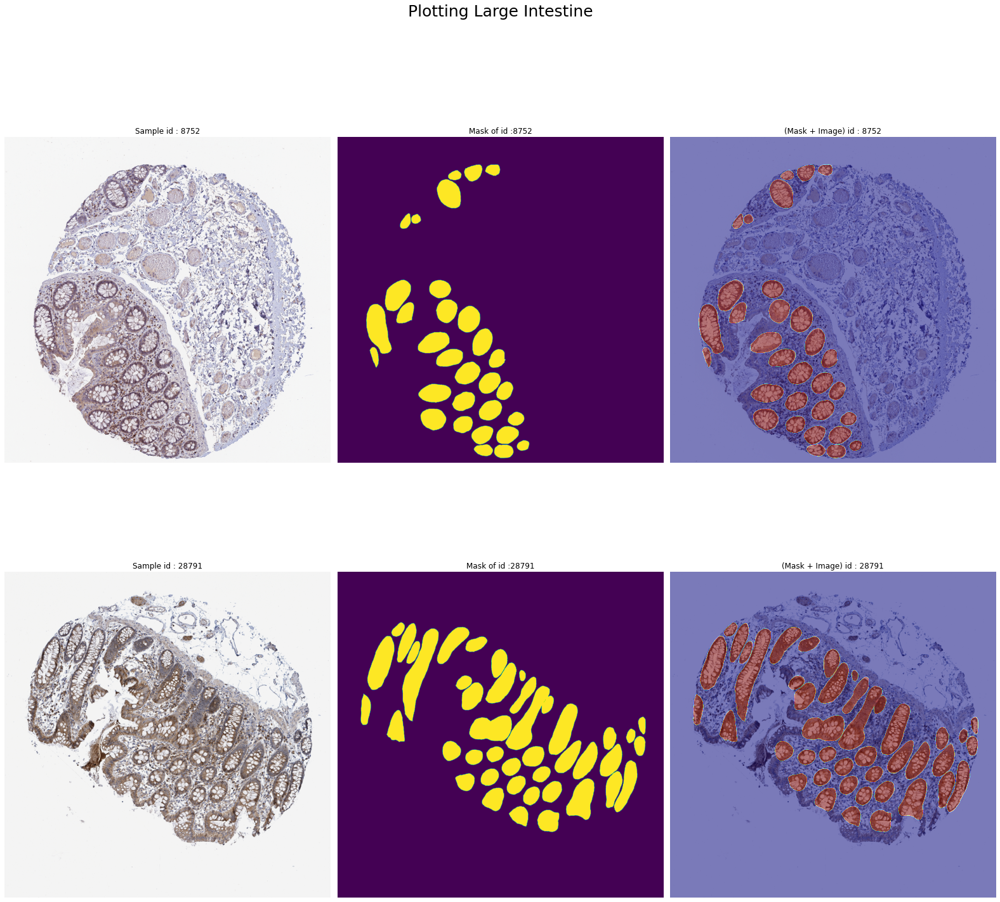

In [22]:
filtered_df = train_df.query('organ=="largeintestine"')
five_samples=random.sample(list(filtered_df ['id']),2)
images_list=[]
for sample in five_samples:
    images_list.append(f"/Users/shambhavisingh/Desktop/dissertation/baseline/train_images/{sample}.tiff")

sample_img(images_list,train_df,'Large Intestine')  

### Pre-processing 

In [23]:
# functions to convert encoding to mask and mask to encoding
# https://www.kaggle.com/paulorzp/rle-functions-run-length-encode-decode
def mask2rle(img): # encoder
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels= img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)
 
def rle2mask(mask_rle, shape=(1600,256)): # decoder
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

def get_image_data(df, im_path):
    """
    :param df: DataFrame with dataset data
    :param im_path: path to image
    :return: id, encoded mask, height and width of image
    """
    id_ = int(im_path.split("/")[-1].split(".")[0]) # image id
    data = df[df['id'] == int(id_)] # dataframe row from image
    mask_rle = data['rle'].iat[0]
    height = data['img_height'].iat[0]
    width = data['img_width'].iat[0]
    return id_, mask_rle, height, width

In [24]:
# rescale to a desire img size
# keep in mide that the size needs to be large enough
# to keep all important features for model training
def rescale(img, mask, size=(2048,2048)):
    scaled_img = cv2.resize(img, size)
    scaled_mask = cv2.resize(mask, size, interpolation=cv2.INTER_NEAREST)
    return scaled_img, scaled_mask

In [25]:
full_img_size=3000

# visualize scaled-down images + masks based on organ
def visualize(df, organ):
    tmp_df = df.loc[train_df['organ'] == organ].reset_index(drop=True)
    plt.figure(figsize=(16,4))
    for i in range(5):
        img  = tiff.imread(TRAIN_PATH + str(tmp_df['id'][i]) +'.tiff')
        mask = rle2mask(tmp_df['rle'][i], (full_img_size, full_img_size))
        scaled_img, scaled_mask = rescale(img, mask)
        plt.subplot(1,5,i+1)
        plt.imshow(scaled_img)
        plt.imshow(scaled_mask, cmap='seismic', alpha=0.4)
        plt.title('ID:'+ str(tmp_df['id'][i]))
    plt.suptitle(organ, fontsize=20)
    plt.tight_layout()

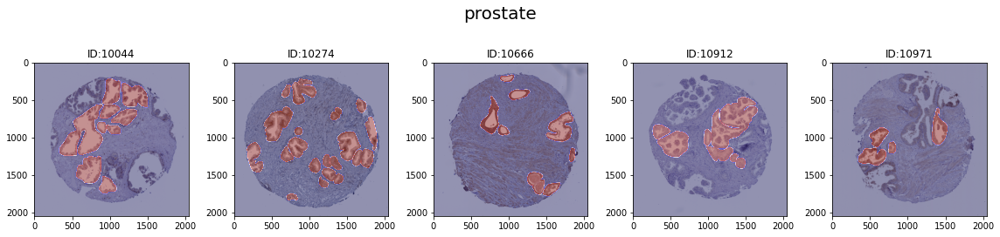

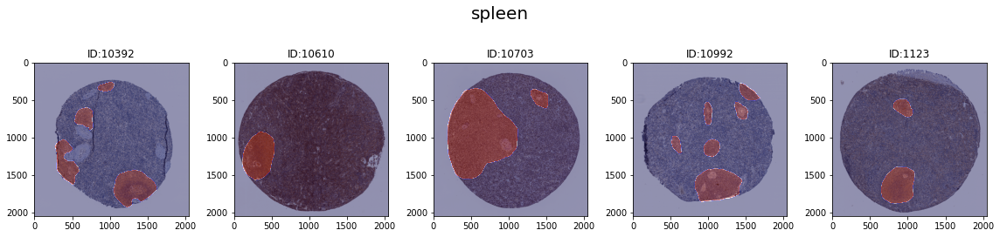

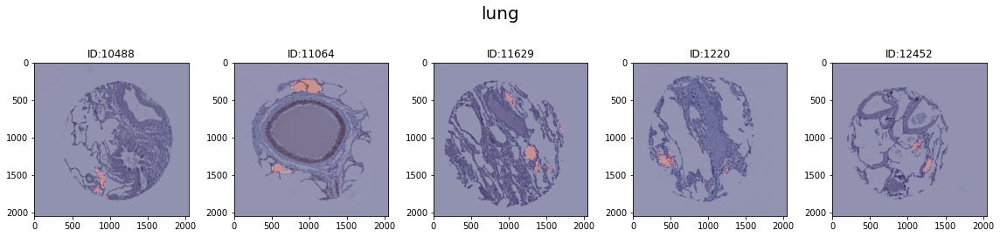

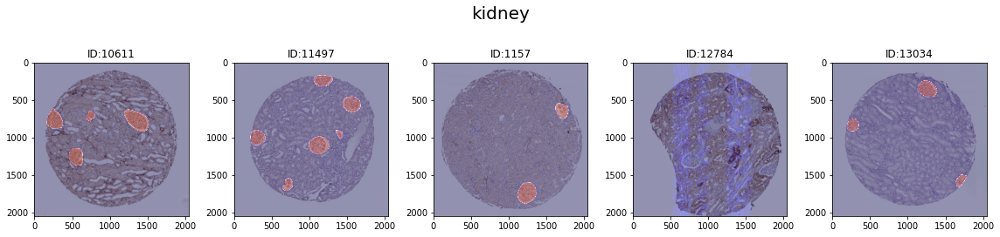

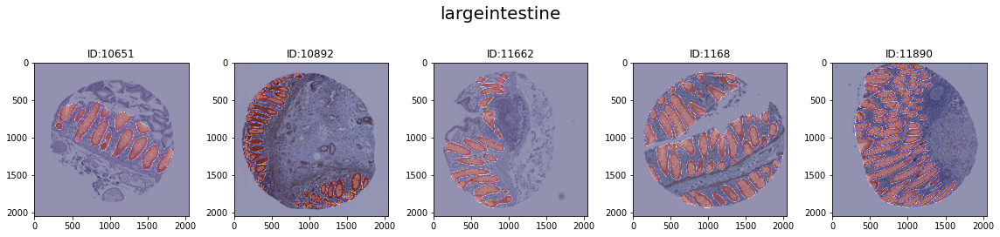

In [26]:
organs = train_df['organ'].unique()
for organ in organs:
    visualize(train_df, organ)
plt.show()

## Tissue Segmentation 

### Thresholding 

In [27]:
def thresholding(img, method='otsu'):
    # convert to grayscale complement image
    grayscale_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_c = 255 - grayscale_img
    thres, thres_img = 0, img_c.copy()
    if method == 'otsu':
        thres, thres_img = cv2.threshold(img_c, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    elif method == 'triangle':
        thres, thres_img = cv2.threshold(img_c, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_TRIANGLE)
    return thres, thres_img, img_c

In [28]:
# adapted from: https://www.kaggle.com/code/analokamus/a-fast-tile-generation
def make_tiles(img, mask, tile_size=256):
    '''
    img: np.ndarray with dtype np.uint8 and shape (width, height, channel)
    mask: np.ndarray with dtype np.uint9 and shape (width, height)
    '''
    w_i, h_i, ch = img.shape
    w_m, h_m     = mask.shape
    
    pad0, pad1 = (tile_size - w_i%tile_size) % tile_size, (tile_size - h_i%tile_size) % tile_size
    
    padding_i = [[pad0//2, pad0-pad0//2], [pad1//2, pad1-pad1//2], [0, 0]]
    padding_m = [[pad0//2, pad0-pad0//2], [pad1//2, pad1-pad1//2]]
    
    img = np.pad(img, padding_i, mode='constant', constant_values=255)
    img = img.reshape(img.shape[0]//tile_size, tile_size, img.shape[1]//tile_size, tile_size, ch)
    img = img.transpose(0, 2, 1, 3, 4).reshape(-1, tile_size, tile_size, ch)
    
    mask = np.pad(mask, padding_m, mode='constant', constant_values=255)
    mask = mask.reshape(mask.shape[0]//tile_size, tile_size, mask.shape[1]//tile_size, tile_size)
    mask = mask.transpose(0, 2, 1, 3).reshape(-1, tile_size, tile_size)
    
    num_tiles = len(mask)
    #     if len(img) < num_tiles: # pad images so that the output shape be the same
    #         padding = [[0, num_tiles-len(img)], [0, 0], [0, 0], [0, 0]]
    #         img = np.pad(img, padding, mode='constant', constant_values=255)
    #idxs = np.argsort(img.reshape(img.shape[0], -1).sum(-1))[:num_tiles] # pick up Top N dark tiles
    #img = img[idxs]
    return img, mask

In [29]:
def get_tiles(im, mask, size):
    """
    :param im: image
    :param mask: decoded mask of image
    :param size: height and width of tile
    :return: every tile of image, decoded mask and size idxs of such
    """
    w = h = size
    # https://stackoverflow.com/a/47581978/4521646
    im_tiles = [im[i:(i + h), j:(j + w), ...] for i in range(0, im.shape[0], h) for j in range(0, im.shape[1], w)]
    mask_tiles = [mask[i:(i + h), j:(j + w), ...] for i in range(0, im.shape[0], h) for j in range(0, im.shape[1], w)]
    idxs_tiles = [(i, (i + h), j, (j + w)) for i in range(0, im.shape[0], h) for j in range(0, im.shape[1], w)]
    # fill border tiles to have same size on every tile
    for k, (im_tile, mask_tile) in enumerate(zip(im_tiles, mask_tiles)):
        if im_tile.shape[:2] != (h, w):
            im_tile_ = im_tile
            mask_tile_ = mask_tile
            im_tile = np.zeros_like(im_tiles[0])
            mask_tile = np.zeros_like(mask_tiles[0])
            im_tile[:im_tile_.shape[0], :im_tile_.shape[1], ...] = im_tile_
            mask_tile[:mask_tile_.shape[0], :mask_tile_.shape[1], ...] = mask_tile_
            im_tiles[k] = im_tile
            mask_tiles[k] = mask_tile
    #print(idxs_tiles)
    return im_tiles, mask_tiles, idxs_tiles

In [30]:
def tile_saving(ID, df, thres, img_folder, mask_folder, rescale_size=(2048,2048), tile_size=512):
    # load original img and mask
    img  = tiff.imread(TRAIN_PATH + str(ID) +'.tiff')
    mask = rle2mask(df.loc[df['id'] == ID].rle.values[0], (full_img_size, full_img_size))
    
    # rescale to 1024x1024
    scaled_img, scaled_mask = rescale(img, mask, size=rescale_size)
    
    # make tiles + select based on given threshold
    img_tiles, mask_tiles, idxs_tiles = get_tiles(scaled_img, scaled_mask, tile_size)
    rle_mask_tiles = [mask2rle(mask_tiles) for mask_tiles in mask_tiles]
    
    #print(idxs_tiles)
    selected_tiles = 0
    for i, (img_crop,rle_mask_tile,idx_tiles) in tqdm(enumerate(zip(img_tiles,rle_mask_tiles,idxs_tiles))):
        
        img_c = 255-img_crop # image complement
        if len(rle_mask_tile.strip()):
            if img_c.mean() > thres   : # pixel value mean greater threshold -> select tile 
                selected_tiles+=1
                tiles_data.append([ID, i, rle_mask_tile,idx_tiles])
                cv2.imwrite(os.path.join(img_folder,f'{ID}_{i}.png'), img_crop)
                cv2.imwrite(os.path.join(mask_folder, f'{ID}_{i}.png'), mask_tiles[i])
    print('-------------Done------------')
    #print('Hi')
    #print(selected_tiles)

In [31]:
def visualize_tiles(img, mask, img_tiles, mask_tiles):
    plt.figure(figsize=(5.5,5.5))
    plt.imshow(img)
    plt.imshow(mask, cmap='seismic', alpha=0.4)
    plt.title(f'Scaled Image + Mask\nImage Size: {img.shape}')
    plt.xticks([])
    plt.yticks([])
    plt.show()
    
    for i, imgs in enumerate(img_tiles):
        plt.figure(figsize=(5.5,5.5))
        num_tiles, size, _, _ = imgs.shape
        rows = cols = int(math.sqrt(num_tiles))
        for j, img_crop in tqdm(enumerate(imgs)):
            plt.subplot(rows,cols,j+1)
            plt.imshow(img_crop)
            plt.imshow(mask_tiles[i][j], cmap='seismic',alpha=0.4)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        plt.suptitle(f'Image + Mask \nNum Tiles: {len(imgs)}\nTile Size: {img_crop.shape}')
        plt.tight_layout()
        plt.show()
    plt.show()

In [32]:
!mkdir train train/image train/mask
img_folder  = '/Users/shambhavisingh/Desktop/dissertation/baseline/train/image'
mask_folder = '/Users/shambhavisingh/Desktop/dissertation/baseline/train/mask'

mkdir: train: File exists
mkdir: train/image: File exists
mkdir: train/mask: File exists


In [33]:
import glob
from tqdm import tqdm
import os
import math

In [34]:
tile_size=512

train_df = pd.read_csv("/Users/shambhavisingh/Desktop/dissertation/baseline/train.csv")
images_path = glob.glob("/Users/shambhavisingh/Desktop/dissertation/baseline/train_images/*.tiff")

tiles_data=[]
for im_path in tqdm(images_path):
    id_, mask_rle, height, width = get_image_data(train_df, im_path)
    
    img_test = tiff.imread(f'/Users/shambhavisingh/Desktop/dissertation/baseline/train_images/{id_}.tiff')
    thres_otsu, thres_img, img_c = thresholding(img_test, method='otsu')
    
    
    tiles_data.append(tile_saving(id_, train_df, thres_otsu, img_folder, mask_folder, tile_size=512))


  0%|                                                   | 0/351 [00:00<?, ?it/s]
16it [00:00, 389.23it/s]
  0%|                                           | 1/351 [00:00<00:39,  8.77it/s]

-------------Done------------



16it [00:00, 1134.42it/s]


-------------Done------------



16it [00:00, 340.22it/s]
  1%|▎                                          | 3/351 [00:00<00:30, 11.56it/s]

-------------Done------------



16it [00:00, 422.34it/s]


-------------Done------------



16it [00:00, 650.46it/s]
  1%|▌                                          | 5/351 [00:00<00:29, 11.90it/s]

-------------Done------------



16it [00:00, 404.50it/s]


-------------Done------------



16it [00:00, 782.63it/s]
  2%|▊                                          | 7/351 [00:00<00:27, 12.73it/s]

-------------Done------------



16it [00:00, 377.61it/s]


-------------Done------------



16it [00:00, 342.80it/s]
  3%|█                                          | 9/351 [00:00<00:29, 11.74it/s]

-------------Done------------



16it [00:00, 312.89it/s]


-------------Done------------



16it [00:00, 397.85it/s]
  3%|█▎                                        | 11/351 [00:00<00:30, 10.98it/s]

-------------Done------------



16it [00:00, 1035.37it/s]


-------------Done------------



16it [00:00, 362.44it/s]
  4%|█▌                                        | 13/351 [00:01<00:30, 10.95it/s]

-------------Done------------



16it [00:00, 1168.31it/s]


-------------Done------------



16it [00:00, 360.08it/s]
  4%|█▊                                        | 15/351 [00:01<00:30, 10.87it/s]

-------------Done------------



16it [00:00, 3461.72it/s]


-------------Done------------



16it [00:00, 489.24it/s]
  5%|██                                        | 17/351 [00:01<00:27, 11.93it/s]

-------------Done------------



16it [00:00, 330.61it/s]


-------------Done------------



16it [00:00, 3752.45it/s]
  5%|██▎                                       | 19/351 [00:01<00:28, 11.60it/s]

-------------Done------------



16it [00:00, 671.70it/s]


-------------Done------------



16it [00:00, 376.88it/s]
  6%|██▌                                       | 21/351 [00:01<00:28, 11.77it/s]

-------------Done------------



0it [00:00, ?it/s]
16it [00:00, 127.78it/s][A


-------------Done------------



16it [00:00, 412.46it/s]
  7%|██▊                                       | 23/351 [00:02<00:34,  9.50it/s]

-------------Done------------



16it [00:00, 339.57it/s]


-------------Done------------



0it [00:00, ?it/s]
16it [00:00, 125.00it/s]
  7%|██▉                                       | 25/351 [00:02<00:38,  8.53it/s]

-------------Done------------



16it [00:00, 202.08it/s]
  7%|███                                       | 26/351 [00:02<00:39,  8.29it/s]

-------------Done------------



16it [00:00, 161.59it/s]
  8%|███▏                                      | 27/351 [00:02<00:41,  7.80it/s]

-------------Done------------



16it [00:00, 490.63it/s]


-------------Done------------



16it [00:00, 1100.16it/s]
  8%|███▍                                      | 29/351 [00:02<00:35,  8.98it/s]

-------------Done------------



16it [00:00, 677.73it/s]


-------------Done------------



16it [00:00, 225.10it/s]
  9%|███▋                                      | 31/351 [00:03<00:34,  9.26it/s]

-------------Done------------



16it [00:00, 418.11it/s]


-------------Done------------



16it [00:00, 500.75it/s]
  9%|███▉                                      | 33/351 [00:03<00:32,  9.83it/s]

-------------Done------------



16it [00:00, 226.04it/s]
 10%|████                                      | 34/351 [00:03<00:33,  9.40it/s]

-------------Done------------



0it [00:00, ?it/s]
16it [00:00, 111.24it/s]
 10%|████▏                                     | 35/351 [00:03<00:42,  7.39it/s]

-------------Done------------



16it [00:00, 536.27it/s]


-------------Done------------



16it [00:00, 556.50it/s]
 11%|████▍                                     | 37/351 [00:03<00:38,  8.19it/s]

-------------Done------------



16it [00:00, 293.09it/s]
 11%|████▌                                     | 38/351 [00:03<00:39,  7.94it/s]

-------------Done------------



16it [00:00, 712.16it/s]
 11%|████▋                                     | 39/351 [00:04<00:37,  8.28it/s]

-------------Done------------



16it [00:00, 637.81it/s]


-------------Done------------



16it [00:00, 184.58it/s]
 12%|████▉                                     | 41/351 [00:04<00:37,  8.37it/s]

-------------Done------------



16it [00:00, 254.15it/s]
 12%|█████                                     | 42/351 [00:04<00:37,  8.16it/s]

-------------Done------------



16it [00:00, 595.57it/s]
 12%|█████▏                                    | 43/351 [00:04<00:36,  8.51it/s]

-------------Done------------



16it [00:00, 352.94it/s]
 13%|█████▎                                    | 44/351 [00:04<00:36,  8.37it/s]

-------------Done------------



16it [00:00, 375.83it/s]
 13%|█████▍                                    | 45/351 [00:04<00:37,  8.26it/s]

-------------Done------------



16it [00:00, 2465.24it/s]


-------------Done------------



16it [00:00, 3908.04it/s]
 13%|█████▌                                    | 47/351 [00:04<00:29, 10.42it/s]

-------------Done------------



16it [00:00, 429.97it/s]


-------------Done------------



16it [00:00, 520.05it/s]
 14%|█████▊                                    | 49/351 [00:05<00:27, 10.97it/s]

-------------Done------------



16it [00:00, 725.69it/s]


-------------Done------------



16it [00:00, 720.49it/s]
 15%|██████                                    | 51/351 [00:05<00:25, 11.63it/s]

-------------Done------------



16it [00:00, 278.65it/s]


-------------Done------------



16it [00:00, 484.23it/s]
 15%|██████▎                                   | 53/351 [00:05<00:28, 10.31it/s]

-------------Done------------



16it [00:00, 778.81it/s]


-------------Done------------



16it [00:00, 3389.17it/s]
 16%|██████▌                                   | 55/351 [00:05<00:26, 11.38it/s]

-------------Done------------



16it [00:00, 404.44it/s]


-------------Done------------



16it [00:00, 358.58it/s]
 16%|██████▊                                   | 57/351 [00:05<00:26, 10.97it/s]

-------------Done------------



16it [00:00, 4050.51it/s]


-------------Done------------



16it [00:00, 211.04it/s]
 17%|███████                                   | 59/351 [00:05<00:26, 10.85it/s]

-------------Done------------



16it [00:00, 532.41it/s]


-------------Done------------



16it [00:00, 1282.05it/s]
 17%|███████▎                                  | 61/351 [00:06<00:25, 11.59it/s]

-------------Done------------



16it [00:00, 1493.93it/s]


-------------Done------------



16it [00:00, 3269.46it/s]
 18%|███████▌                                  | 63/351 [00:06<00:23, 12.52it/s]

-------------Done------------



16it [00:00, 433.53it/s]


-------------Done------------



16it [00:00, 430.66it/s]
 19%|███████▊                                  | 65/351 [00:06<00:24, 11.71it/s]

-------------Done------------



16it [00:00, 383.04it/s]


-------------Done------------



16it [00:00, 2050.25it/s]
 19%|████████                                  | 67/351 [00:06<00:24, 11.63it/s]

-------------Done------------



16it [00:00, 415.44it/s]


-------------Done------------



16it [00:00, 221.50it/s]
 20%|████████▎                                 | 69/351 [00:06<00:26, 10.53it/s]

-------------Done------------



16it [00:00, 337.45it/s]


-------------Done------------



16it [00:00, 4124.95it/s]
 20%|████████▍                                 | 71/351 [00:07<00:24, 11.31it/s]

-------------Done------------



16it [00:00, 180.35it/s]


-------------Done------------



16it [00:00, 556.06it/s]
 21%|████████▋                                 | 73/351 [00:07<00:25, 10.73it/s]

-------------Done------------



16it [00:00, 2770.00it/s]


-------------Done------------



16it [00:00, 425.15it/s]
 21%|████████▉                                 | 75/351 [00:07<00:23, 11.80it/s]

-------------Done------------



16it [00:00, 694.48it/s]


-------------Done------------



16it [00:00, 1371.50it/s]
 22%|█████████▏                                | 77/351 [00:07<00:21, 12.47it/s]

-------------Done------------



16it [00:00, 3236.97it/s]


-------------Done------------



16it [00:00, 426.37it/s]
 23%|█████████▍                                | 79/351 [00:07<00:20, 13.46it/s]

-------------Done------------



16it [00:00, 803.54it/s]


-------------Done------------



16it [00:00, 209.80it/s]
 23%|█████████▋                                | 81/351 [00:07<00:21, 12.58it/s]

-------------Done------------



16it [00:00, 744.74it/s]


-------------Done------------



16it [00:00, 787.04it/s]
 24%|█████████▉                                | 83/351 [00:07<00:20, 13.30it/s]

-------------Done------------



16it [00:00, 433.57it/s]


-------------Done------------



16it [00:00, 542.79it/s]
 24%|██████████▏                               | 85/351 [00:08<00:20, 13.06it/s]

-------------Done------------



16it [00:00, 270.02it/s]


-------------Done------------



16it [00:00, 506.37it/s]
 25%|██████████▍                               | 87/351 [00:08<00:22, 11.85it/s]

-------------Done------------



16it [00:00, 453.05it/s]


-------------Done------------



16it [00:00, 380.84it/s]
 25%|██████████▋                               | 89/351 [00:08<00:22, 11.90it/s]

-------------Done------------



16it [00:00, 390.76it/s]


-------------Done------------



0it [00:00, ?it/s]
16it [00:00, 140.39it/s]
 26%|██████████▉                               | 91/351 [00:08<00:26,  9.71it/s]

-------------Done------------



16it [00:00, 428.86it/s]


-------------Done------------



16it [00:00, 240.33it/s]
 26%|███████████▏                              | 93/351 [00:08<00:27,  9.32it/s]

-------------Done------------



16it [00:00, 343.17it/s]
 27%|███████████▏                              | 94/351 [00:09<00:27,  9.29it/s]

-------------Done------------



16it [00:00, 321.10it/s]
 27%|███████████▎                              | 95/351 [00:09<00:28,  8.95it/s]

-------------Done------------



16it [00:00, 504.54it/s]
 27%|███████████▍                              | 96/351 [00:09<00:34,  7.29it/s]

-------------Done------------



16it [00:00, 374.36it/s]


-------------Done------------



16it [00:00, 619.29it/s]
 28%|███████████▋                              | 98/351 [00:09<00:31,  8.05it/s]

-------------Done------------



16it [00:00, 2653.78it/s]


-------------Done------------



0it [00:00, ?it/s]
16it [00:00, 130.76it/s]
 28%|███████████▋                             | 100/351 [00:09<00:34,  7.31it/s]

-------------Done------------



16it [00:00, 225.69it/s]
 29%|███████████▊                             | 101/351 [00:10<00:35,  6.99it/s]

-------------Done------------



16it [00:00, 214.63it/s]
 29%|███████████▉                             | 102/351 [00:10<00:36,  6.85it/s]

-------------Done------------



16it [00:00, 457.76it/s]
 29%|████████████                             | 103/351 [00:10<00:34,  7.19it/s]

-------------Done------------



16it [00:00, 409.84it/s]


-------------Done------------



16it [00:00, 406.46it/s]
 30%|████████████▎                            | 105/351 [00:10<00:28,  8.49it/s]

-------------Done------------



16it [00:00, 536.19it/s]


-------------Done------------



16it [00:00, 224.14it/s]
 30%|████████████▍                            | 107/351 [00:10<00:27,  9.00it/s]

-------------Done------------



16it [00:00, 344.49it/s]
 31%|████████████▌                            | 108/351 [00:10<00:26,  9.18it/s]

-------------Done------------



16it [00:00, 411.83it/s]


-------------Done------------



16it [00:00, 717.16it/s]
 31%|████████████▊                            | 110/351 [00:11<00:23, 10.20it/s]

-------------Done------------



16it [00:00, 371.49it/s]


-------------Done------------



16it [00:00, 1250.40it/s]
 32%|█████████████                            | 112/351 [00:11<00:22, 10.53it/s]

-------------Done------------



16it [00:00, 234.35it/s]


-------------Done------------



16it [00:00, 4970.66it/s]
 32%|█████████████▎                           | 114/351 [00:11<00:21, 11.05it/s]

-------------Done------------



16it [00:00, 1266.61it/s]


-------------Done------------



16it [00:00, 526.84it/s]
 33%|█████████████▌                           | 116/351 [00:11<00:19, 11.86it/s]

-------------Done------------



16it [00:00, 763.51it/s]


-------------Done------------



0it [00:00, ?it/s]
16it [00:00, 157.14it/s]
 34%|█████████████▊                           | 118/351 [00:11<00:22, 10.54it/s]

-------------Done------------



16it [00:00, 1139.83it/s]


-------------Done------------



16it [00:00, 232.94it/s]
 34%|██████████████                           | 120/351 [00:11<00:22, 10.20it/s]

-------------Done------------



16it [00:00, 738.90it/s]


-------------Done------------



16it [00:00, 538.66it/s]
 35%|██████████████▎                          | 122/351 [00:12<00:21, 10.80it/s]

-------------Done------------



16it [00:00, 450.83it/s]


-------------Done------------



16it [00:00, 420.45it/s]
 35%|██████████████▍                          | 124/351 [00:12<00:20, 11.02it/s]

-------------Done------------



16it [00:00, 390.04it/s]


-------------Done------------



16it [00:00, 404.35it/s]
 36%|██████████████▋                          | 126/351 [00:12<00:20, 10.87it/s]

-------------Done------------



16it [00:00, 680.59it/s]


-------------Done------------



16it [00:00, 1249.70it/s]
 36%|██████████████▉                          | 128/351 [00:12<00:19, 11.66it/s]

-------------Done------------



16it [00:00, 3859.05it/s]


-------------Done------------



16it [00:00, 249.10it/s]
 37%|███████████████▏                         | 130/351 [00:12<00:18, 11.70it/s]

-------------Done------------



16it [00:00, 437.89it/s]


-------------Done------------



16it [00:00, 4020.18it/s]
 38%|███████████████▍                         | 132/351 [00:12<00:17, 12.19it/s]

-------------Done------------



16it [00:00, 437.72it/s]


-------------Done------------



16it [00:00, 307.23it/s]
 38%|███████████████▋                         | 134/351 [00:13<00:18, 11.90it/s]

-------------Done------------



16it [00:00, 408.69it/s]


-------------Done------------



16it [00:00, 384.64it/s]
 39%|███████████████▉                         | 136/351 [00:13<00:18, 11.67it/s]

-------------Done------------



16it [00:00, 3651.39it/s]


-------------Done------------



16it [00:00, 250.91it/s]
 39%|████████████████                         | 138/351 [00:13<00:17, 12.10it/s]

-------------Done------------



16it [00:00, 231.36it/s]


-------------Done------------



16it [00:00, 743.70it/s]
 40%|████████████████▎                        | 140/351 [00:13<00:18, 11.69it/s]

-------------Done------------



16it [00:00, 707.87it/s]


-------------Done------------



16it [00:00, 204.60it/s]
 40%|████████████████▌                        | 142/351 [00:13<00:19, 10.83it/s]

-------------Done------------



16it [00:00, 732.53it/s]


-------------Done------------



16it [00:00, 380.44it/s]
 41%|████████████████▊                        | 144/351 [00:14<00:18, 11.10it/s]

-------------Done------------



16it [00:00, 432.04it/s]


-------------Done------------



16it [00:00, 398.33it/s]
 42%|█████████████████                        | 146/351 [00:14<00:18, 11.13it/s]

-------------Done------------



16it [00:00, 1048.63it/s]


-------------Done------------



16it [00:00, 390.85it/s]
 42%|█████████████████▎                       | 148/351 [00:14<00:18, 10.76it/s]

-------------Done------------



16it [00:00, 204.70it/s]


-------------Done------------



16it [00:00, 179.77it/s]
 43%|█████████████████▌                       | 150/351 [00:14<00:21,  9.49it/s]

-------------Done------------



16it [00:00, 558.91it/s]


-------------Done------------



16it [00:00, 397.21it/s]
 43%|█████████████████▊                       | 152/351 [00:14<00:19, 10.24it/s]

-------------Done------------



16it [00:00, 288.36it/s]


-------------Done------------



16it [00:00, 3167.75it/s]
 44%|█████████████████▉                       | 154/351 [00:15<00:17, 10.99it/s]

-------------Done------------



16it [00:00, 230.03it/s]


-------------Done------------



16it [00:00, 407.14it/s]
 44%|██████████████████▏                      | 156/351 [00:15<00:18, 10.67it/s]

-------------Done------------



16it [00:00, 379.97it/s]


-------------Done------------



16it [00:00, 518.65it/s]
 45%|██████████████████▍                      | 158/351 [00:15<00:17, 10.81it/s]

-------------Done------------



0it [00:00, ?it/s]
16it [00:00, 149.28it/s]


-------------Done------------



16it [00:00, 4162.05it/s]
 46%|██████████████████▋                      | 160/351 [00:15<00:18, 10.37it/s]

-------------Done------------



16it [00:00, 484.44it/s]


-------------Done------------



16it [00:00, 3939.93it/s]
 46%|██████████████████▉                      | 162/351 [00:15<00:16, 11.40it/s]

-------------Done------------



16it [00:00, 225.24it/s]


-------------Done------------



16it [00:00, 483.63it/s]
 47%|███████████████████▏                     | 164/351 [00:15<00:18, 10.18it/s]

-------------Done------------



16it [00:00, 546.91it/s]


-------------Done------------



16it [00:00, 798.29it/s]
 47%|███████████████████▍                     | 166/351 [00:16<00:16, 11.07it/s]

-------------Done------------



16it [00:00, 1376.96it/s]


-------------Done------------



16it [00:00, 554.04it/s]
 48%|███████████████████▌                     | 168/351 [00:16<00:14, 12.24it/s]

-------------Done------------



16it [00:00, 717.40it/s]


-------------Done------------



16it [00:00, 857.37it/s]
 48%|███████████████████▊                     | 170/351 [00:16<00:13, 12.99it/s]

-------------Done------------



16it [00:00, 329.39it/s]


-------------Done------------



16it [00:00, 412.74it/s]
 49%|████████████████████                     | 172/351 [00:16<00:14, 12.37it/s]

-------------Done------------



16it [00:00, 1199.77it/s]


-------------Done------------



0it [00:00, ?it/s]
16it [00:00, 156.56it/s]
 50%|████████████████████▎                    | 174/351 [00:16<00:15, 11.24it/s]

-------------Done------------



16it [00:00, 305.32it/s]


-------------Done------------



16it [00:00, 368.83it/s]
 50%|████████████████████▌                    | 176/351 [00:16<00:16, 10.91it/s]

-------------Done------------



16it [00:00, 371.99it/s]


-------------Done------------



16it [00:00, 540.98it/s]
 51%|████████████████████▊                    | 178/351 [00:17<00:15, 11.06it/s]

-------------Done------------



16it [00:00, 256.31it/s]


-------------Done------------



16it [00:00, 481.12it/s]
 51%|█████████████████████                    | 180/351 [00:17<00:16, 10.62it/s]

-------------Done------------



16it [00:00, 437.40it/s]


-------------Done------------



16it [00:00, 408.00it/s]
 52%|█████████████████████▎                   | 182/351 [00:17<00:15, 10.84it/s]

-------------Done------------



16it [00:00, 324.85it/s]


-------------Done------------



16it [00:00, 274.90it/s]
 52%|█████████████████████▍                   | 184/351 [00:17<00:16, 10.35it/s]

-------------Done------------



16it [00:00, 410.10it/s]


-------------Done------------



16it [00:00, 385.12it/s]
 53%|█████████████████████▋                   | 186/351 [00:17<00:16, 10.24it/s]

-------------Done------------



16it [00:00, 365.82it/s]


-------------Done------------



16it [00:00, 666.20it/s]
 54%|█████████████████████▉                   | 188/351 [00:18<00:15, 10.19it/s]

-------------Done------------



16it [00:00, 243.59it/s]


-------------Done------------



16it [00:00, 694.23it/s]
 54%|██████████████████████▏                  | 190/351 [00:18<00:16, 10.04it/s]

-------------Done------------



16it [00:00, 1108.05it/s]


-------------Done------------



16it [00:00, 699.08it/s]
 55%|██████████████████████▍                  | 192/351 [00:18<00:14, 11.04it/s]

-------------Done------------



16it [00:00, 635.19it/s]


-------------Done------------



16it [00:00, 230.22it/s]
 55%|██████████████████████▋                  | 194/351 [00:18<00:14, 10.61it/s]

-------------Done------------



16it [00:00, 377.56it/s]


-------------Done------------



16it [00:00, 491.39it/s]
 56%|██████████████████████▉                  | 196/351 [00:18<00:15, 10.25it/s]

-------------Done------------



16it [00:00, 548.49it/s]


-------------Done------------



16it [00:00, 737.40it/s]
 56%|███████████████████████▏                 | 198/351 [00:19<00:13, 11.01it/s]

-------------Done------------



16it [00:00, 643.45it/s]


-------------Done------------



16it [00:00, 1270.35it/s]
 57%|███████████████████████▎                 | 200/351 [00:19<00:13, 11.44it/s]

-------------Done------------



16it [00:00, 2987.26it/s]


-------------Done------------



16it [00:00, 272.47it/s]
 58%|███████████████████████▌                 | 202/351 [00:19<00:12, 11.67it/s]

-------------Done------------



16it [00:00, 687.88it/s]


-------------Done------------



16it [00:00, 475.51it/s]
 58%|███████████████████████▊                 | 204/351 [00:19<00:12, 11.65it/s]

-------------Done------------



16it [00:00, 928.62it/s]


-------------Done------------



16it [00:00, 205.14it/s]
 59%|████████████████████████                 | 206/351 [00:19<00:12, 11.23it/s]

-------------Done------------



16it [00:00, 324.85it/s]


-------------Done------------



16it [00:00, 2950.23it/s]
 59%|████████████████████████▎                | 208/351 [00:19<00:12, 11.72it/s]

-------------Done------------



16it [00:00, 199.27it/s]


-------------Done------------



16it [00:00, 521.17it/s]
 60%|████████████████████████▌                | 210/351 [00:20<00:12, 10.90it/s]

-------------Done------------



16it [00:00, 495.42it/s]


-------------Done------------



16it [00:00, 779.43it/s]
 60%|████████████████████████▊                | 212/351 [00:20<00:12, 11.22it/s]

-------------Done------------



16it [00:00, 220.37it/s]


-------------Done------------



16it [00:00, 557.61it/s]
 61%|████████████████████████▉                | 214/351 [00:20<00:12, 11.03it/s]

-------------Done------------



16it [00:00, 4117.11it/s]


-------------Done------------



16it [00:00, 352.24it/s]
 62%|█████████████████████████▏               | 216/351 [00:20<00:11, 11.90it/s]

-------------Done------------



16it [00:00, 402.02it/s]


-------------Done------------



16it [00:00, 486.20it/s]
 62%|█████████████████████████▍               | 218/351 [00:20<00:11, 11.58it/s]

-------------Done------------



16it [00:00, 749.13it/s]


-------------Done------------



16it [00:00, 169.71it/s]
 63%|█████████████████████████▋               | 220/351 [00:20<00:12, 10.77it/s]

-------------Done------------



16it [00:00, 3456.55it/s]


-------------Done------------



16it [00:00, 405.18it/s]
 63%|█████████████████████████▉               | 222/351 [00:21<00:11, 11.30it/s]

-------------Done------------



16it [00:00, 1070.23it/s]


-------------Done------------



16it [00:00, 308.17it/s]
 64%|██████████████████████████▏              | 224/351 [00:21<00:11, 11.35it/s]

-------------Done------------



16it [00:00, 375.41it/s]


-------------Done------------



16it [00:00, 660.26it/s]
 64%|██████████████████████████▍              | 226/351 [00:21<00:11, 11.15it/s]

-------------Done------------



16it [00:00, 3010.31it/s]


-------------Done------------



0it [00:00, ?it/s]
16it [00:00, 130.11it/s]
 65%|██████████████████████████▋              | 228/351 [00:21<00:12,  9.69it/s]

-------------Done------------



16it [00:00, 638.06it/s]


-------------Done------------



16it [00:00, 292.72it/s]
 66%|██████████████████████████▊              | 230/351 [00:21<00:12,  9.65it/s]

-------------Done------------



16it [00:00, 314.10it/s]
 66%|██████████████████████████▉              | 231/351 [00:22<00:12,  9.65it/s]

-------------Done------------



16it [00:00, 728.83it/s]


-------------Done------------



16it [00:00, 501.82it/s]
 66%|███████████████████████████▏             | 233/351 [00:22<00:11, 10.41it/s]

-------------Done------------



16it [00:00, 255.20it/s]


-------------Done------------



16it [00:00, 3397.75it/s]
 67%|███████████████████████████▍             | 235/351 [00:22<00:10, 10.79it/s]

-------------Done------------



16it [00:00, 430.16it/s]


-------------Done------------



16it [00:00, 1449.28it/s]
 68%|███████████████████████████▋             | 237/351 [00:22<00:09, 11.69it/s]

-------------Done------------



16it [00:00, 307.37it/s]


-------------Done------------



16it [00:00, 261.14it/s]
 68%|███████████████████████████▉             | 239/351 [00:22<00:10, 10.86it/s]

-------------Done------------



16it [00:00, 522.87it/s]


-------------Done------------



16it [00:00, 191.44it/s]
 69%|████████████████████████████▏            | 241/351 [00:23<00:11,  9.23it/s]

-------------Done------------



16it [00:00, 326.63it/s]
 69%|████████████████████████████▎            | 242/351 [00:23<00:12,  9.03it/s]

-------------Done------------



16it [00:00, 674.68it/s]


-------------Done------------



16it [00:00, 687.43it/s]
 70%|████████████████████████████▌            | 244/351 [00:23<00:10,  9.82it/s]

-------------Done------------



16it [00:00, 384.53it/s]


-------------Done------------



16it [00:00, 453.36it/s]
 70%|████████████████████████████▋            | 246/351 [00:23<00:10,  9.93it/s]

-------------Done------------



16it [00:00, 234.31it/s]


-------------Done------------



16it [00:00, 379.54it/s]
 71%|████████████████████████████▉            | 248/351 [00:23<00:10,  9.38it/s]

-------------Done------------



16it [00:00, 264.44it/s]
 71%|█████████████████████████████            | 249/351 [00:23<00:10,  9.40it/s]

-------------Done------------



16it [00:00, 284.40it/s]
 71%|█████████████████████████████▏           | 250/351 [00:24<00:11,  8.87it/s]

-------------Done------------



16it [00:00, 305.94it/s]
 72%|█████████████████████████████▎           | 251/351 [00:24<00:11,  8.91it/s]

-------------Done------------



16it [00:00, 211.33it/s]
 72%|█████████████████████████████▍           | 252/351 [00:24<00:11,  8.54it/s]

-------------Done------------



16it [00:00, 1078.75it/s]


-------------Done------------



16it [00:00, 514.09it/s]
 72%|█████████████████████████████▋           | 254/351 [00:24<00:09, 10.25it/s]

-------------Done------------



16it [00:00, 440.23it/s]


-------------Done------------



16it [00:00, 787.83it/s]
 73%|█████████████████████████████▉           | 256/351 [00:24<00:08, 11.37it/s]

-------------Done------------



16it [00:00, 507.02it/s]


-------------Done------------



16it [00:00, 415.39it/s]
 74%|██████████████████████████████▏          | 258/351 [00:24<00:08, 11.37it/s]

-------------Done------------



16it [00:00, 645.99it/s]


-------------Done------------



16it [00:00, 531.58it/s]
 74%|██████████████████████████████▎          | 260/351 [00:24<00:07, 11.60it/s]

-------------Done------------



16it [00:00, 1320.34it/s]


-------------Done------------



16it [00:00, 756.75it/s]
 75%|██████████████████████████████▌          | 262/351 [00:25<00:06, 12.85it/s]

-------------Done------------



16it [00:00, 962.18it/s]


-------------Done------------



16it [00:00, 1223.14it/s]
 75%|██████████████████████████████▊          | 264/351 [00:25<00:06, 13.24it/s]

-------------Done------------



16it [00:00, 472.44it/s]


-------------Done------------



16it [00:00, 1256.18it/s]
 76%|███████████████████████████████          | 266/351 [00:25<00:06, 12.95it/s]

-------------Done------------



16it [00:00, 695.44it/s]


-------------Done------------



16it [00:00, 2659.99it/s]
 76%|███████████████████████████████▎         | 268/351 [00:25<00:06, 13.71it/s]

-------------Done------------



16it [00:00, 1048.69it/s]


-------------Done------------



16it [00:00, 480.41it/s]
 77%|███████████████████████████████▌         | 270/351 [00:25<00:06, 13.21it/s]

-------------Done------------



16it [00:00, 433.58it/s]


-------------Done------------



16it [00:00, 342.27it/s]
 77%|███████████████████████████████▊         | 272/351 [00:25<00:06, 12.67it/s]

-------------Done------------



16it [00:00, 2667.07it/s]


-------------Done------------



16it [00:00, 384.92it/s]
 78%|████████████████████████████████         | 274/351 [00:25<00:06, 12.47it/s]

-------------Done------------



16it [00:00, 306.27it/s]


-------------Done------------



16it [00:00, 797.41it/s]
 79%|████████████████████████████████▏        | 276/351 [00:26<00:06, 12.15it/s]

-------------Done------------



16it [00:00, 1967.77it/s]


-------------Done------------



16it [00:00, 409.08it/s]
 79%|████████████████████████████████▍        | 278/351 [00:26<00:06, 11.68it/s]

-------------Done------------



16it [00:00, 604.24it/s]


-------------Done------------



16it [00:00, 464.33it/s]
 80%|████████████████████████████████▋        | 280/351 [00:26<00:05, 12.06it/s]

-------------Done------------



16it [00:00, 342.49it/s]


-------------Done------------



16it [00:00, 4186.72it/s]
 80%|████████████████████████████████▉        | 282/351 [00:26<00:05, 12.63it/s]

-------------Done------------



16it [00:00, 342.87it/s]


-------------Done------------



16it [00:00, 4532.55it/s]
 81%|█████████████████████████████████▏       | 284/351 [00:26<00:05, 12.59it/s]

-------------Done------------



16it [00:00, 493.95it/s]


-------------Done------------



16it [00:00, 527.08it/s]
 81%|█████████████████████████████████▍       | 286/351 [00:26<00:05, 11.79it/s]

-------------Done------------



16it [00:00, 406.16it/s]


-------------Done------------



16it [00:00, 363.91it/s]
 82%|█████████████████████████████████▋       | 288/351 [00:27<00:06,  9.51it/s]

-------------Done------------



16it [00:00, 1348.41it/s]


-------------Done------------



16it [00:00, 1302.93it/s]
 83%|█████████████████████████████████▊       | 290/351 [00:27<00:05, 10.98it/s]

-------------Done------------



16it [00:00, 541.79it/s]


-------------Done------------



16it [00:00, 440.62it/s]
 83%|██████████████████████████████████       | 292/351 [00:27<00:05, 11.30it/s]

-------------Done------------



16it [00:00, 395.09it/s]


-------------Done------------



16it [00:00, 634.04it/s]
 84%|██████████████████████████████████▎      | 294/351 [00:27<00:05, 11.15it/s]

-------------Done------------



16it [00:00, 174.41it/s]


-------------Done------------



16it [00:00, 3903.49it/s]
 84%|██████████████████████████████████▌      | 296/351 [00:27<00:05, 10.24it/s]

-------------Done------------



16it [00:00, 441.28it/s]


-------------Done------------



16it [00:00, 200.14it/s]
 85%|██████████████████████████████████▊      | 298/351 [00:28<00:05,  9.35it/s]

-------------Done------------



16it [00:00, 187.84it/s]
 85%|██████████████████████████████████▉      | 299/351 [00:28<00:06,  8.66it/s]

-------------Done------------



16it [00:00, 236.13it/s]
 85%|███████████████████████████████████      | 300/351 [00:28<00:06,  8.12it/s]

-------------Done------------



16it [00:00, 998.69it/s]


-------------Done------------



16it [00:00, 500.61it/s]
 86%|███████████████████████████████████▎     | 302/351 [00:28<00:05,  8.90it/s]

-------------Done------------



16it [00:00, 215.75it/s]
 86%|███████████████████████████████████▍     | 303/351 [00:28<00:06,  7.28it/s]

-------------Done------------



16it [00:00, 694.15it/s]


-------------Done------------



16it [00:00, 529.61it/s]
 87%|███████████████████████████████████▋     | 305/351 [00:29<00:05,  8.55it/s]

-------------Done------------



16it [00:00, 387.90it/s]


-------------Done------------



16it [00:00, 625.07it/s]
 87%|███████████████████████████████████▊     | 307/351 [00:29<00:04,  9.13it/s]

-------------Done------------



16it [00:00, 747.28it/s]


-------------Done------------



16it [00:00, 459.09it/s]
 88%|████████████████████████████████████     | 309/351 [00:29<00:04,  9.80it/s]

-------------Done------------



16it [00:00, 541.62it/s]


-------------Done------------



16it [00:00, 697.23it/s]
 89%|████████████████████████████████████▎    | 311/351 [00:29<00:04,  9.96it/s]

-------------Done------------



16it [00:00, 477.57it/s]


-------------Done------------



0it [00:00, ?it/s]
16it [00:00, 112.76it/s]A
 89%|████████████████████████████████████▌    | 313/351 [00:30<00:04,  7.98it/s]

-------------Done------------



16it [00:00, 714.93it/s]
 89%|████████████████████████████████████▋    | 314/351 [00:30<00:04,  8.14it/s]

-------------Done------------



16it [00:00, 278.17it/s]
 90%|████████████████████████████████████▊    | 315/351 [00:30<00:04,  7.82it/s]

-------------Done------------



16it [00:00, 2526.97it/s]


-------------Done------------



16it [00:00, 650.22it/s]
 90%|█████████████████████████████████████    | 317/351 [00:30<00:03,  9.06it/s]

-------------Done------------



16it [00:00, 567.62it/s]
 91%|█████████████████████████████████████▏   | 318/351 [00:30<00:03,  9.04it/s]

-------------Done------------



16it [00:00, 415.03it/s]
 91%|█████████████████████████████████████▎   | 319/351 [00:30<00:03,  9.12it/s]

-------------Done------------



16it [00:00, 720.07it/s]


-------------Done------------



16it [00:00, 246.56it/s]
 91%|█████████████████████████████████████▍   | 321/351 [00:30<00:03,  9.19it/s]

-------------Done------------



16it [00:00, 685.53it/s]


-------------Done------------



16it [00:00, 343.22it/s]
 92%|█████████████████████████████████████▋   | 323/351 [00:31<00:03,  9.12it/s]

-------------Done------------



16it [00:00, 319.66it/s]
 92%|█████████████████████████████████████▊   | 324/351 [00:31<00:02,  9.21it/s]

-------------Done------------



16it [00:00, 347.45it/s]
 93%|█████████████████████████████████████▉   | 325/351 [00:31<00:02,  9.20it/s]

-------------Done------------



16it [00:00, 305.90it/s]
 93%|██████████████████████████████████████   | 326/351 [00:31<00:02,  9.29it/s]

-------------Done------------



16it [00:00, 343.45it/s]
 93%|██████████████████████████████████████▏  | 327/351 [00:31<00:02,  8.74it/s]

-------------Done------------



16it [00:00, 5205.06it/s]


-------------Done------------



16it [00:00, 610.15it/s]
 94%|██████████████████████████████████████▍  | 329/351 [00:31<00:02, 10.66it/s]

-------------Done------------



16it [00:00, 373.63it/s]


-------------Done------------



16it [00:00, 408.52it/s]
 94%|██████████████████████████████████████▋  | 331/351 [00:31<00:01, 10.05it/s]

-------------Done------------



16it [00:00, 330.54it/s]


-------------Done------------



16it [00:00, 362.99it/s]
 95%|██████████████████████████████████████▉  | 333/351 [00:32<00:01,  9.23it/s]

-------------Done------------



16it [00:00, 384.60it/s]


-------------Done------------



16it [00:00, 462.84it/s]
 95%|███████████████████████████████████████▏ | 335/351 [00:32<00:01,  9.21it/s]

-------------Done------------



16it [00:00, 4641.64it/s]


-------------Done------------



16it [00:00, 703.32it/s]
 96%|███████████████████████████████████████▎ | 337/351 [00:32<00:01, 10.45it/s]

-------------Done------------



16it [00:00, 590.38it/s]


-------------Done------------



16it [00:00, 1047.20it/s]
 97%|███████████████████████████████████████▌ | 339/351 [00:32<00:01, 10.67it/s]

-------------Done------------



16it [00:00, 973.42it/s]


-------------Done------------



16it [00:00, 412.93it/s]
 97%|███████████████████████████████████████▊ | 341/351 [00:32<00:00, 10.52it/s]

-------------Done------------



16it [00:00, 3782.49it/s]


-------------Done------------



16it [00:00, 194.79it/s]
 98%|████████████████████████████████████████ | 343/351 [00:33<00:00, 10.36it/s]

-------------Done------------



16it [00:00, 757.54it/s]


-------------Done------------



16it [00:00, 331.23it/s]
 98%|████████████████████████████████████████▎| 345/351 [00:33<00:00, 10.34it/s]

-------------Done------------



16it [00:00, 401.92it/s]


-------------Done------------



16it [00:00, 4021.87it/s]
 99%|████████████████████████████████████████▌| 347/351 [00:33<00:00, 11.14it/s]

-------------Done------------



16it [00:00, 402.94it/s]


-------------Done------------



16it [00:00, 331.11it/s]
 99%|████████████████████████████████████████▊| 349/351 [00:33<00:00,  9.64it/s]

-------------Done------------



16it [00:00, 3404.81it/s]


-------------Done------------



16it [00:00, 3728.68it/s]
100%|█████████████████████████████████████████| 351/351 [00:33<00:00, 10.37it/s]

-------------Done------------


In [35]:
train_tiles_csv = "./train_tiles.csv"

res = [i for i in tiles_data if i is not None]

tiles_df = pd.DataFrame(res, columns=['id', 'idx', 'rle', "idxs_tile"])
train_df = train_df.loc[:, train_df.columns != 'rle'] # remove original rle, use the tile one
train_tiles_df = pd.merge(train_df, tiles_df, on="id", how="left") # merge both dataframes to have image data for every tile
train_tiles_df.to_csv(train_tiles_csv, index=False)

## Visualization of what is happening with one random example 

In [36]:
# visualize selected tiles
def tile_selection(img, mask, thres, tile_size=512):
    img_tiles, mask_tiles = make_tiles(img, mask, tile_size)
    num_tiles, size, _, _ = img_tiles.shape
    rows = cols = int(math.sqrt(num_tiles))
    plt.figure(figsize=(5.5,5.5))
    
    for i, img_crop in tqdm(enumerate(img_tiles)):
            plt.subplot(rows,cols,i+1)
            plt.imshow(img_crop)
            plt.imshow(mask_tiles[i], cmap='seismic',alpha=0.4)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
    plt.suptitle(f'Image + Mask \nNum Tiles: {len(img_tiles)}\nTile Size: {img_tiles[0].shape}')
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(5.5,5.5))
    selected_tiles = 0
    for i, img_crop in tqdm(enumerate(img_tiles)):
        img_c = 255-img_crop # image complement
        plt.subplot(rows, cols, i+1)
        plt.xticks([])
        plt.yticks([])
        if img_c.mean() > thres: # pixel value mean greater threshold -> select tile 
            selected_tiles += 1
            plt.imshow(img_crop)
            plt.imshow(mask_tiles[i], cmap='seismic', alpha=0.4)
            plt.tight_layout()
    plt.suptitle(f'Num Tiles: {len(img_tiles)}\nNum Selected Tiles: {selected_tiles}\nThreshold: {thres}')
    plt.tight_layout()
    plt.show()

In [37]:
train_tiles_df.head()

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,age,sex,idx,rle,idxs_tile
0,10044,prostate,HPA,3000,3000,0.4,4,37.0,Male,5.0,415 98 927 98 1438 99 1814 23 1948 101 2325 24...,"(512, 1024, 512, 1024)"
1,10044,prostate,HPA,3000,3000,0.4,4,37.0,Male,6.0,1 47 53 155 253 43 329 119 513 47 565 155 765 ...,"(512, 1024, 1024, 1536)"
2,10044,prostate,HPA,3000,3000,0.4,4,37.0,Male,9.0,1 222 513 222 1025 222 1537 222 2049 222 2561 ...,"(1024, 1536, 512, 1024)"
3,10274,prostate,HPA,3000,3000,0.4,4,76.0,Male,5.0,158 355 670 355 1182 355 1693 356 2205 356 271...,"(512, 1024, 512, 1024)"
4,10274,prostate,HPA,3000,3000,0.4,4,76.0,Male,6.0,125134 17 125644 19 126152 36 126663 37 127173...,"(512, 1024, 1024, 1536)"


In [40]:
train_df1 = pd.read_csv(data_path / 'train.csv')


In [41]:
# resize img, mask to 1024x1024 before tiling
ID = 1690
img = tiff.imread(f'/Users/shambhavisingh/Desktop/dissertation/baseline/train_images/{ID}*.tiff')
mask = rle2mask(train_df1.loc[train_df1['id'] == ID].rle.values[0], (full_img_size, full_img_size))
scaled_img, scaled_mask = rescale(img, mask, size=(2048,2048))

In [42]:
img_tiles, mask_tiles = make_tiles(scaled_img, scaled_mask, tile_size=512)

In [43]:
tiles=[img_tiles]
masks=[mask_tiles]

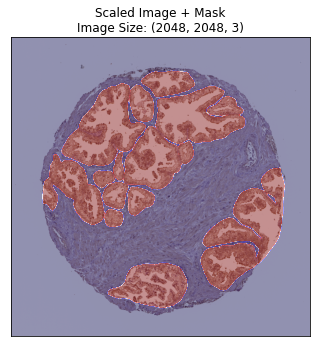

16it [00:00, 23.08it/s]


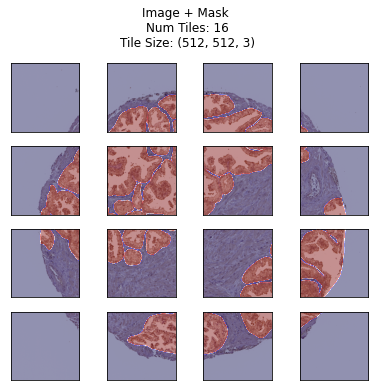

In [44]:
visualize_tiles(scaled_img, scaled_mask, tiles, masks)

In [45]:
def histogram(img, thres_img, img_c, thres):
    """
    style: ['color', 'grayscale']
    """ 
    plt.figure(figsize=(10,10))
    
    plt.subplot(3,2,1)
    plt.imshow(img)
    plt.title('Original Image')
    
    plt.subplot(3,2,2)
    sns.histplot(img.ravel(), bins=np.arange(0,256), color='orange', alpha=0.5)
    sns.histplot(img[:,:,0].ravel(), bins=np.arange(0,256), color='red', alpha=0.5)
    sns.histplot(img[:,:,1].ravel(), bins=np.arange(0,256), color='Green', alpha=0.5)
    sns.histplot(img[:,:,2].ravel(), bins=np.arange(0,256), color='Blue', alpha=0.5)
    plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])
    plt.ylim(0,0.3e6)
    plt.xlabel('Intensity value')
    plt.title('Color Histogram')
    
    plt.subplot(3,2,3)
    plt.imshow(img_c, cmap='gist_gray')
    plt.title('Complement Grayscale Image')
    
    plt.subplot(3,2,4)
    sns.histplot(img_c.ravel(), bins=np.arange(0,256))
    plt.axvline(thres, c='red', linestyle="--")
    plt.ylim(0,0.3e6)
    plt.xlabel('Intensity value')
    plt.title('Grayscale Complement Histogram')
    
    plt.subplot(3,2,5)
    plt.imshow(thres_img, cmap='gist_gray')
    plt.title('Thresholded Image')
    
    plt.subplot(3,2,6)
    sns.histplot(thres_img.ravel(), bins=np.arange(0,256))
    plt.axvline(thres, c='red', linestyle="--")
    plt.ylim(0,0.3e6)
    plt.xlabel('Intensity value')
    plt.title('Thresholded Histogram')
    
    plt.tight_layout()
    plt.show()

In [50]:
img_test2 = tiff.imread('/Users/shambhavisingh/Desktop/dissertation/baseline/train_images/1690.tiff')
thres_otsu, thres_img, img_c = thresholding(img_test2, method='otsu')
thres, thres_img, img_c = thresholding(img_test2, method='triangle')

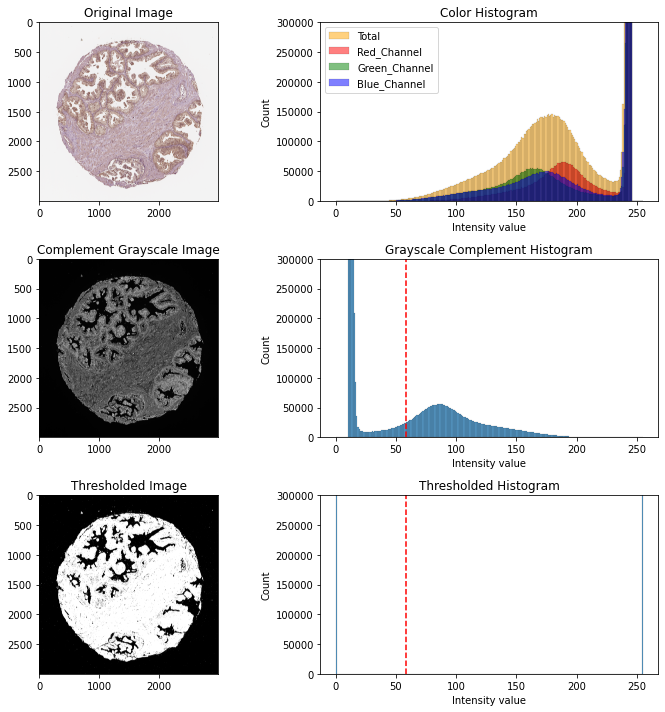

In [51]:
histogram(img_test2, thres_img, img_c, thres_otsu)

In [52]:
t= (thres_otsu+ thres)/2

16it [00:00, 35.07it/s]


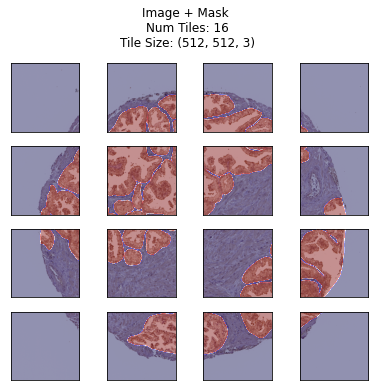

16it [00:00, 43.37it/s]


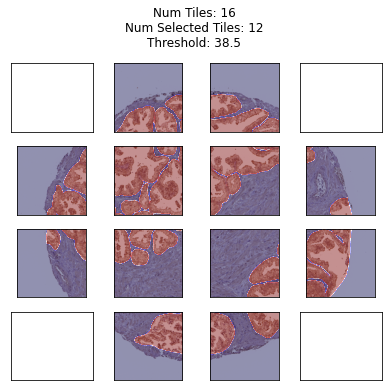

In [53]:
tile_selection(scaled_img, scaled_mask, t, tile_size=512)